##Anas Baig 002837748

## All the Earthquakes- Analysis and Prediction Using Decsion Tree, Regression, XGboost and Random Forest

In [ ]:
#Loading all dependencies
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import seaborn as sns
import plotly.express as px
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import plotly.graph_objs as go
import plotly.offline as pyo
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import pandas as pd
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
#Loading our dataset
df =pd.read_csv("Eartquakes-1990-2023.csv")

# Load tectonic plate boundary data using geopandas

plate_boundaries_gdf = gpd.read_file('PB2002_boundaries.shp')

# Load world countries boundary data using geopandas
world_countries_gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\1002508962.py:9: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
df.head()

,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
0,631153353990,"12 km NNW of Meadow Lakes, Alaska",reviewed,0,96,earthquake,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00
1,631153491210,"14 km S of Volcano, Hawaii",reviewed,0,31,earthquake,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00
2,631154083450,"7 km W of Cobb, California",reviewed,0,19,earthquake,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00
3,631155512130,"11 km E of Mammoth Lakes, California",reviewed,0,15,earthquake,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00
4,631155824490,"16km N of Fillmore, CA",reviewed,0,134,earthquake,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00


### Checking all Features and Their DataType

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3445751 entries, 0 to 3445750
Data columns (total 12 columns):
 #   Column        Dtype  
---  ------        -----  
 0   time          int64  
 1   place         object 
 2   status        object 
 3   tsunami       int64  
 4   significance  int64  
 5   data_type     object 
 6   magnitudo     float64
 7   state         object 
 8   longitude     float64
 9   latitude      float64
 10  depth         float64
 11  date          object 
dtypes: float64(4), int64(3), object(5)
memory usage: 315.5+ MB


### Checking for null Values

In [ ]:
df.isnull().sum()

time            0
place           0
status          0
tsunami         0
significance    0
data_type       0
magnitudo       0
state           0
longitude       0
latitude        0
depth           0
date            0
dtype: int64

### Converting 'date' from object to Datetime dtype

In [ ]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3445751 entries, 0 to 3445750
Data columns (total 12 columns):
 #   Column        Dtype              
---  ------        -----              
 0   time          int64              
 1   place         object             
 2   status        object             
 3   tsunami       int64              
 4   significance  int64              
 5   data_type     object             
 6   magnitudo     float64            
 7   state         object             
 8   longitude     float64            
 9   latitude      float64            
 10  depth         float64            
 11  date          datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1), float64(4), int64(3), object(4)
memory usage: 315.5+ MB


### Checking for unique values in each column

In [ ]:
df.nunique()

time            3428775
place            531130
status                6
tsunami               2
significance       1170
data_type            25
magnitudo           933
state               858
longitude        733599
latitude         518295
depth             78386
date            3428775
dtype: int64

### Checking for most occurences in State Column

In [ ]:
state_counts = df['state'].value_counts()
print(state_counts.head(20))

 California          866675
 Alaska              777881
California           491689
 Nevada              174065
 Hawaii              125336
 Washington           80483
 Utah                 55471
 Montana              53426
 Indonesia            48502
 Puerto Rico          46275
 Chile                37171
 Greece               30423
 B.C.                 30000
 Japan                28908
 Oklahoma             25132
 Papua New Guinea     23030
 Italy                18632
 Philippines          17822
 Oregon               17650
 Mexico               16573
Name: state, dtype: int64


## Data Preprocessing & EDA

In [ ]:
# Finding duplicate rows
duplicate_rows = df[df.duplicated(keep='first')]

# Number of duplicate rows
num_duplicates = duplicate_rows.shape[0]

# Displaying the duplicate rows
print(f"Number of duplicate rows: {num_duplicates}")
duplicate_rows

Number of duplicate rows: 16869


,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
9214,636249654650,"3 km E of Mammoth Lakes, California",reviewed,0,42,earthquake,1.66,California,-118.933667,37.647000,3.816000,1990-03-01 00:00:54.650000+00:00
9216,636249667890,"4km N of Claremont, CA",reviewed,0,70,earthquake,2.13,California,-117.717000,34.133000,4.275000,1990-03-01 00:01:07.890000+00:00
9218,636249694400,"4km N of Claremont, CA",reviewed,0,62,earthquake,2.00,California,-117.717000,34.133000,4.275000,1990-03-01 00:01:34.400000+00:00
9220,636249712400,"5km NNE of Claremont, CA",reviewed,0,22,earthquake,1.20,California,-117.705000,34.144000,5.702000,1990-03-01 00:01:52.400000+00:00
9222,636249724170,"4km N of Claremont, CA",reviewed,0,160,earthquake,3.22,California,-117.714000,34.130000,5.622000,1990-03-01 00:02:04.170000+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
3386776,1677800561550,"6km WNW of Cobb, CA",automatic,0,2,earthquake,0.36,California,-122.790169,38.834667,1.590000,2023-03-02 23:42:41.550000+00:00
3386778,1677800571801,western Texas,reviewed,0,62,earthquake,2.00,western Texas,-104.407287,31.674925,7.185596,2023-03-02 23:42:51.801000+00:00
3386780,1677800938538,"49 km N of Petersville, Alaska",reviewed,0,35,earthquake,1.50,Alaska,-150.759600,62.942400,109.700000,2023-03-02 23:48:58.538000+00:00
3386782,1677801044380,"83 km NNW of Karluk, Alaska",reviewed,0,0,earthquake,0.04,Alaska,-155.069167,58.246000,4.900000,2023-03-02 23:50:44.380000+00:00


In [ ]:
# Drop duplicates rows
df.drop_duplicates(keep='first', inplace=True)

### We will Extract following Features from the Date column

In [ ]:
def transform_date(df):
    df = df.copy()
    df["hour"] = df.date.dt.hour
    df["day_of_month"] = df.date.dt.day
    df["weekday"] = df.date.dt.day_name()
    df["month"] = df.date.dt.month
    df["month_name"] = df.date.dt.month_name()
    df["year"] =df.date.dt.year
    return df
df = transform_date(df)

### From the below graph we can infer that magnitude of earthquake has been increasing overtime, There might be multiple reason like Urbanization, Climate change however we also have to consider the improvement in the technology to record earthquake data.

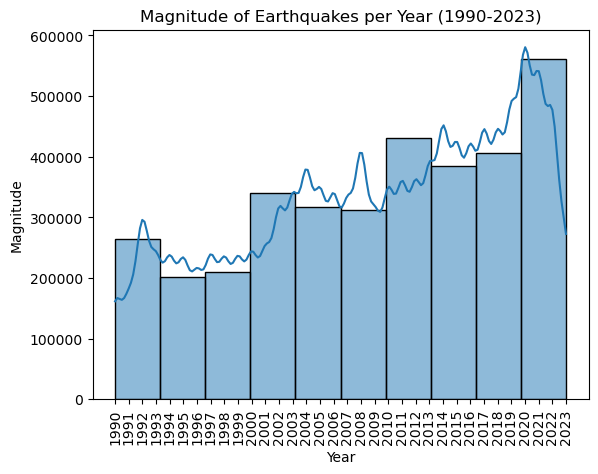

In [ ]:
# Extract the year
year = df.year

# Extract the magnitude
magnitude = df.magnitudo

# Plot a histogram of the magnitude of earthquakes per year using Seaborn
sns.histplot(magnitude, bins=10, kde=True, x=year)
plt.xlabel("Year")
plt.ylabel("Magnitude")
plt.title("Magnitude of Earthquakes per Year (1990-2023)")
plt.xticks(range(1990, 2024), rotation=90)
plt.show()

### This Graph shows the distribution of magnitude values and we can see that most common earthquakes have values ranging from 0 to 5 magnitude.

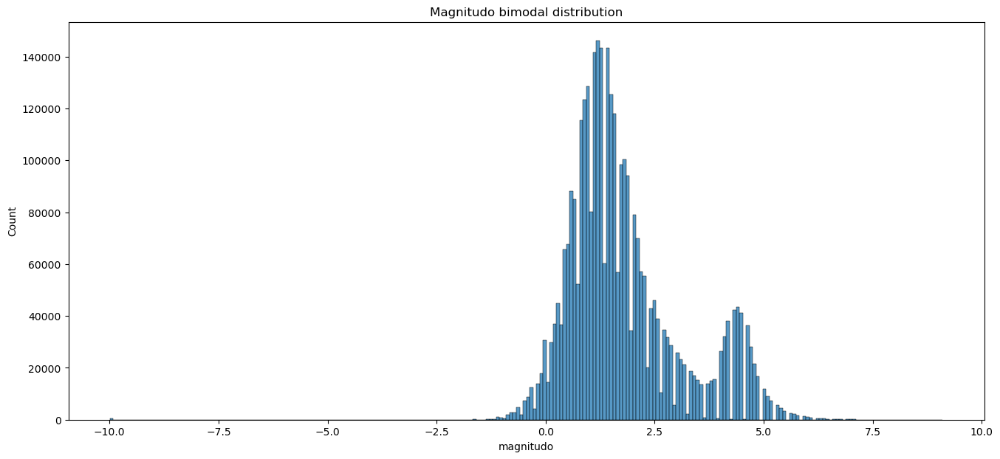

In [ ]:
plt.figure(figsize = (16,7))
sns.histplot(df["magnitudo"], bins = 250)
plt.title("Magnitudo bimodal distribution")
plt.show()

### Cleaning the status column and merging the repeated values

In [ ]:
df['status'].unique()

array(['reviewed', 'automatic', 'AUTOMATIC', 'REVIEWED', 'MANUAL',
       'manual'], dtype=object)

In [ ]:
import re

status_mapping = {'reviewed': 'Reviewed', 'automatic': 'Automatic', 'manual': 'Manual'}

# Use regular expressions with the re.IGNORECASE flag to replace values
for pattern, replacement in status_mapping.items():
    df['status'] = df['status'].replace(re.compile(pattern, re.IGNORECASE), replacement)

# Verify the updated value counts
print(df['status'].value_counts())

Reviewed     3223055
Automatic     205815
Manual            12
Name: status, dtype: int64


### Here we check the unique values of data_type column

In [ ]:
df['data_type'].value_counts()


earthquake                    3345360
quarry blast                    38684
explosion                       26440
ice quake                       13794
mining explosion                 2156
other event                      1702
chemical explosion                314
rock burst                        180
sonic boom                        104
nuclear explosion                  56
mine collapse                      20
volcanic eruption                  17
quarry                             15
not reported                       12
experimental explosion              9
landslide                           8
acoustic noise                      2
rockslide                           2
Ice Quake                           1
induced or triggered event          1
accidental explosion                1
meteorite                           1
collapse                            1
Rock Slide                          1
snow avalanche                      1
Name: data_type, dtype: int64

### We plot to see if there are enough miscellenous values in data_type that might make a considerable impact in the model predicition

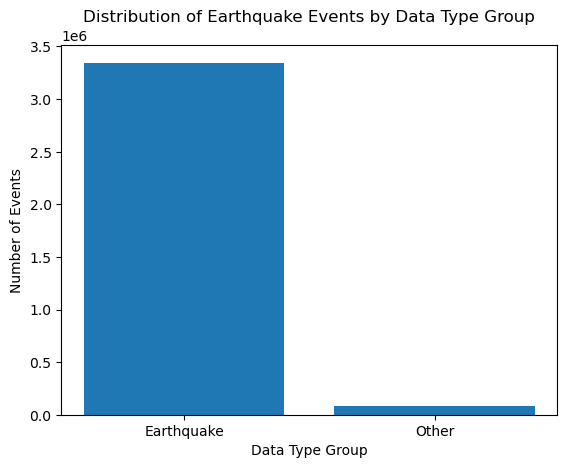

In [ ]:
# Create a new column called 'data_type_group'
df['data_type_group'] = df['data_type'].apply(lambda x: 'Earthquake' if x == 'earthquake' else 'Other')

# Group the values in the 'data_type_group' column and count the number of events in each group
data_type_counts = df['data_type_group'].value_counts()

# Create a new plot to visualize the number of events in each group
plt.figure()
plt.bar(data_type_counts.index, data_type_counts.values)
plt.xlabel('Data Type Group')
plt.ylabel('Number of Events')
plt.title('Distribution of Earthquake Events by Data Type Group')
plt.show()

### We plot a box plot distribution by year to get a better idea of the magnitude distribution

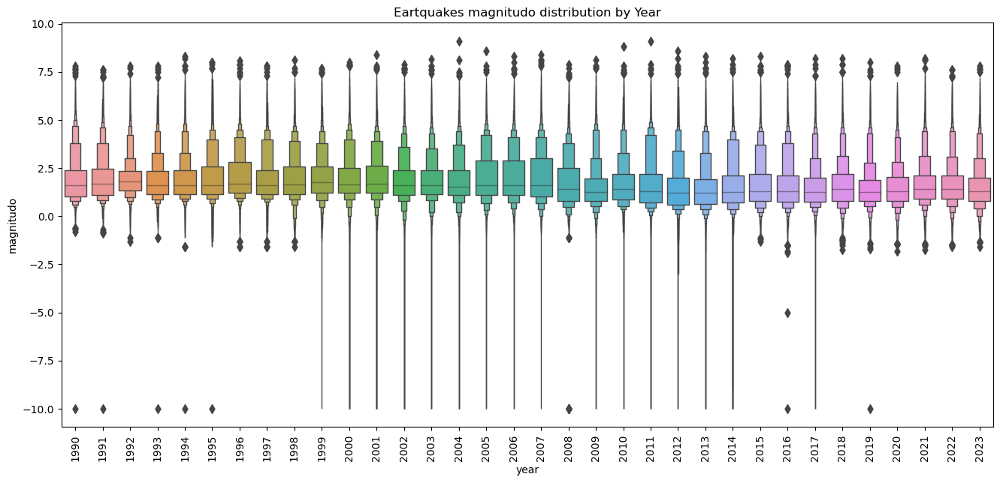

In [ ]:
plt.figure(figsize=(16,7))
sns.boxenplot(df,x="year", y="magnitudo",linewidth=1 )
plt.xticks(rotation=90)
plt.title("Eartquakes magnitudo distribution by Year")
plt.show()

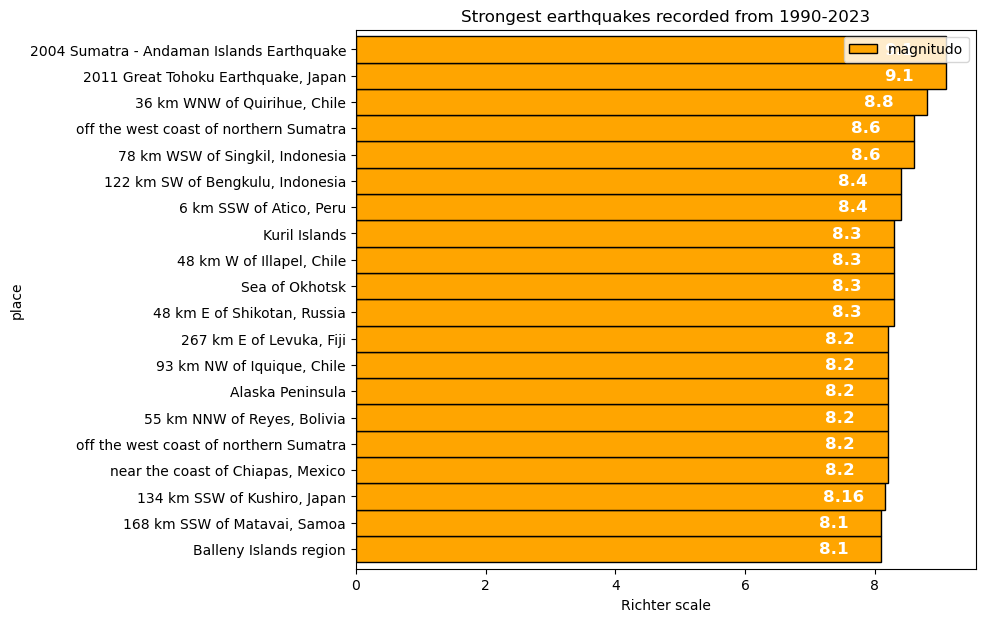

In [ ]:
top_mag = df.sort_values(by="magnitudo", ascending = False).head(20)

plot = top_mag.sort_values(by="magnitudo").plot(x="place",y="magnitudo", kind ="barh",width=1, edgecolor="black",figsize =(8,7),color = "orange")
for bars in plot.containers:
        plot.bar_label(bars, padding=-45, fontsize=12, color="white", weight="bold")
plt.title("Strongest earthquakes recorded from 1990-2023")
plt.xlabel("Richter scale")
plt.show()


### Ploting Strongest Earthquakes

### We generate a report to get a better idea of our data

In [ ]:
profile = ProfileReport(df)
profile                     # or this one
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Filter earthquakes with magnitudo greater than 7
filtered_magnitudo = df[df['magnitudo'] > 7]

### Usually the high impact earthquakes are over a magnitude of 7

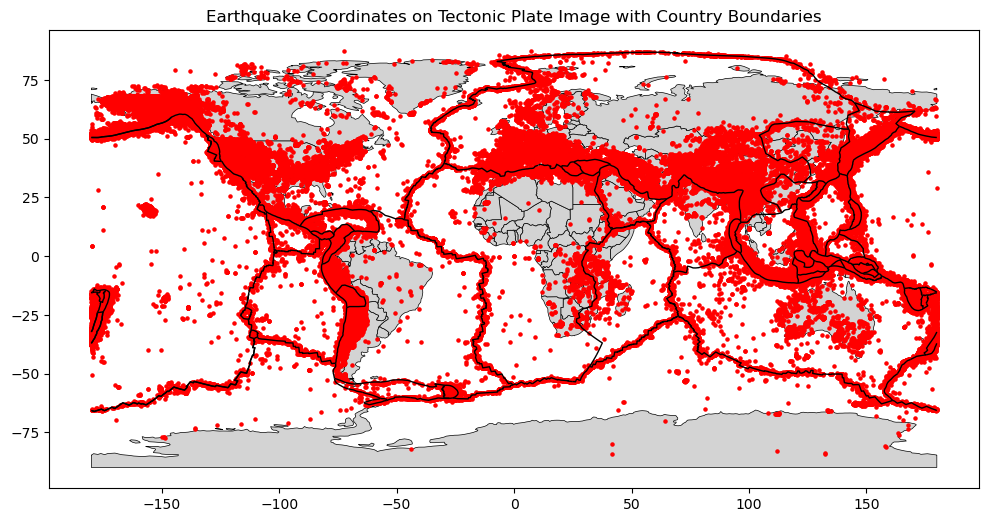

In [ ]:
# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(df['longitude'], df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(df, geometry=earthquake_geometry)



# Create a world map with tectonic plate boundaries, countries, and earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot earthquake coordinates on top of the map
earthquake_gdf.plot(ax=ax, color='red', markersize=5)

# Set plot title and show the map
plt.title('Earthquake Coordinates on Tectonic Plate Image with Country Boundaries')
plt.show()

### We plot histograms for magnitude, significance, and depth to get to filter values for them so that we get a more meaningful plot

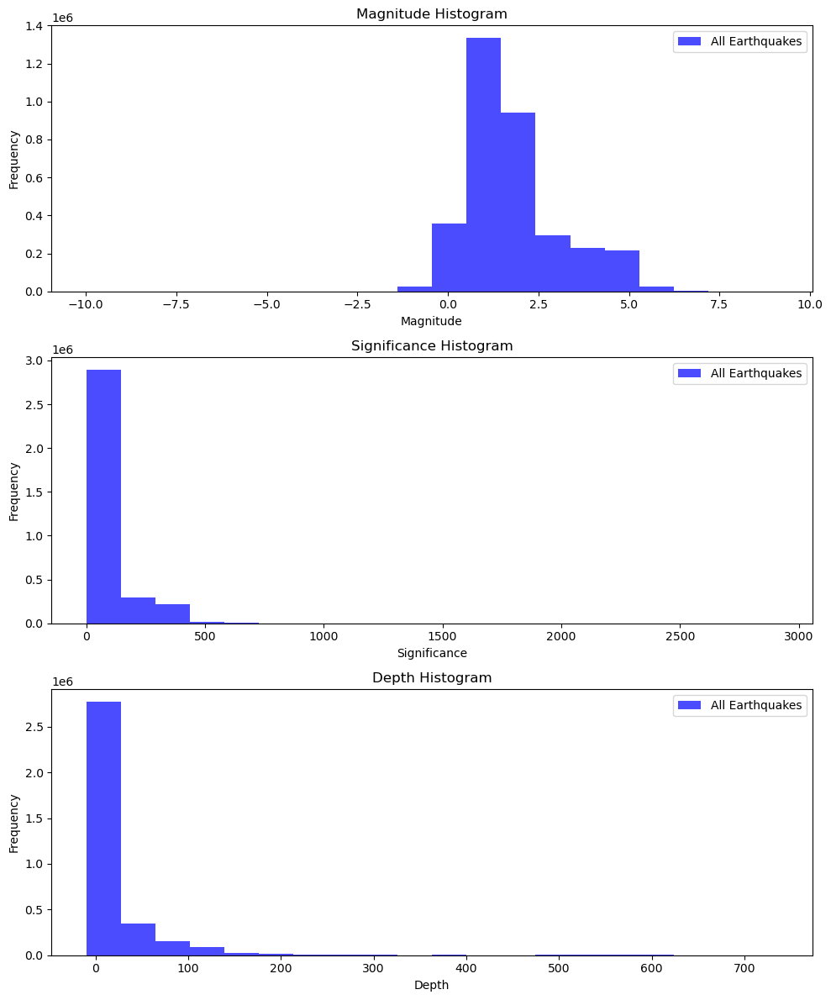

In [ ]:
# Create separate histograms for magnitude, significance, and depth
fig, axs = plt.subplots(3, 1, figsize=(10, 12))

# Plot Magnitude Histogram
axs[0].hist(df['magnitudo'], bins=20, color='blue', alpha=0.7, label='All Earthquakes')
axs[0].set_title('Magnitude Histogram')
axs[0].set_xlabel('Magnitude')
axs[0].set_ylabel('Frequency')
axs[0].legend()

# Plot Significance Histogram
axs[1].hist(df['significance'], bins=20, color='blue', alpha=0.7, label='All Earthquakes')
axs[1].set_title('Significance Histogram')
axs[1].set_xlabel('Significance')
axs[1].set_ylabel('Frequency')
axs[1].legend()

# Plot Depth Histogram
axs[2].hist(df['depth'], bins=20, color='blue', alpha=0.7, label='All Earthquakes')
axs[2].set_title('Depth Histogram')
axs[2].set_xlabel('Depth')
axs[2].set_ylabel('Frequency')
axs[2].legend()

# Adjust layout
plt.tight_layout()
plt.show()

### We try to visualize relationship between magnitude, significance, and depth

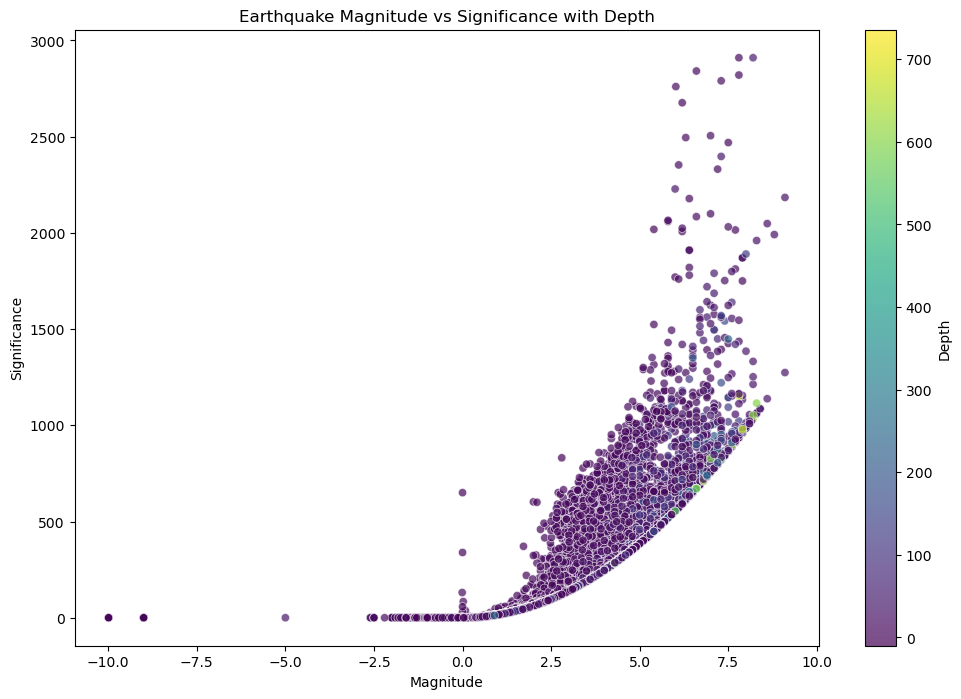

In [ ]:
# Filter out NaN values for better plotting
filtered_df = df.dropna(subset=['magnitudo', 'significance', 'depth'])

# Create a scatter plot
plt.figure(figsize=(12, 8))

plt.scatter(filtered_df['magnitudo'], filtered_df['significance'], c=filtered_df['depth'], cmap='viridis', alpha=0.7, edgecolors='w', linewidth=0.5)

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('Depth')

# Set labels and title
plt.xlabel('Magnitude')
plt.ylabel('Significance')
plt.title('Earthquake Magnitude vs Significance with Depth')

# Show the plot
plt.show()

### We can conclude  from this graph most earthquakes occur near the boundaries of the tectonic plates

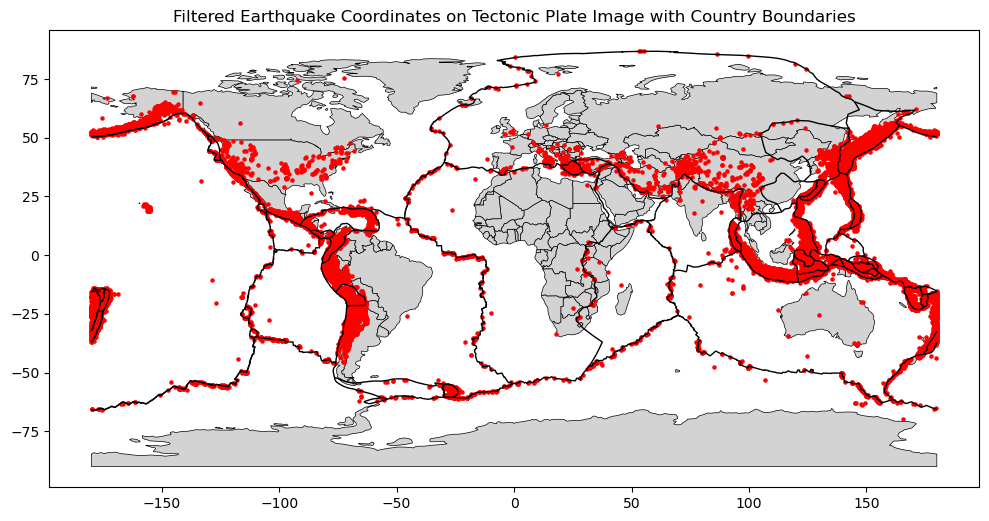

In [ ]:
# Filter earthquakes with high magnitudes, significance, and depth
high_magnitude_df = df[df['magnitudo'] > 8]
high_significance_df = df[df['significance'] > 500]
deep_earthquakes_df = df[df['depth'] > 100]

# Combine filtered dataframes
filtered_earthquakes_df = pd.concat([high_magnitude_df, high_significance_df, deep_earthquakes_df], ignore_index=True).drop_duplicates()

# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(filtered_earthquakes_df['longitude'], filtered_earthquakes_df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(filtered_earthquakes_df, geometry=earthquake_geometry)



# Create a world map with tectonic plate boundaries, countries, and filtered earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot filtered earthquake coordinates on top of the map
earthquake_gdf.plot(ax=ax, color='red', markersize=5)

# Set plot title and show the map
plt.title('Filtered Earthquake Coordinates on Tectonic Plate Image with Country Boundaries')
plt.show()

### Usually tsunami occur after earthquakes in deep sea or earthquakes near coastal areas

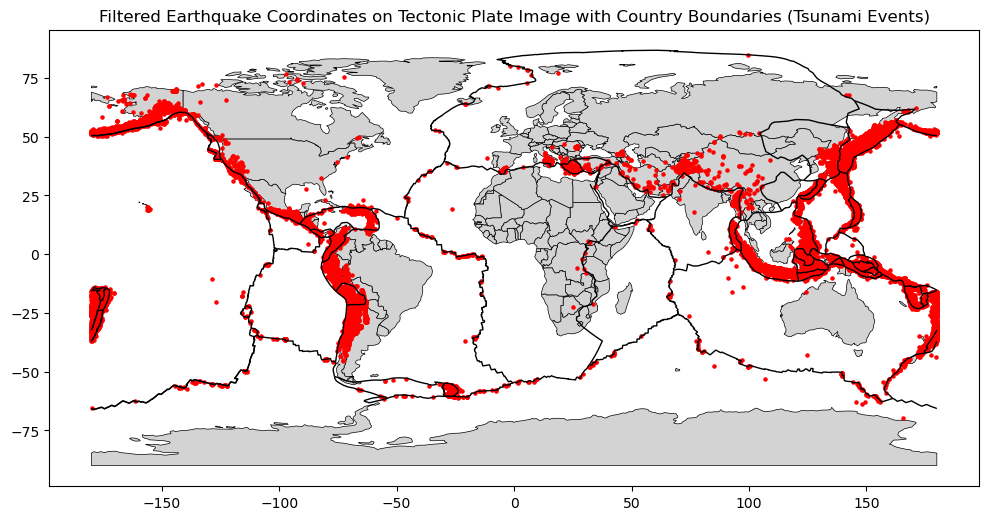

In [ ]:
# Filter earthquakes with high magnitudes, significance, depth, and tsunami = 1
high_magnitude_df = df[df['magnitudo'] > 6]
high_significance_df = df[df['significance'] > 2000]
deep_earthquakes_df = df[df['depth'] > 100]
tsunami_df = df[df['tsunami'] == 1]

# Combine filtered dataframes
filtered_earthquakes_df = pd.concat([high_magnitude_df, high_significance_df, deep_earthquakes_df, tsunami_df], ignore_index=True).drop_duplicates()

# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(filtered_earthquakes_df['longitude'], filtered_earthquakes_df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(filtered_earthquakes_df, geometry=earthquake_geometry)


# Create a world map with tectonic plate boundaries, countries, and filtered earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot filtered earthquake coordinates on top of the map
earthquake_gdf.plot(ax=ax, color='red', markersize=5)

# Set plot title and show the map
plt.title('Filtered Earthquake Coordinates on Tectonic Plate Image with Country Boundaries (Tsunami Events)')
plt.show()

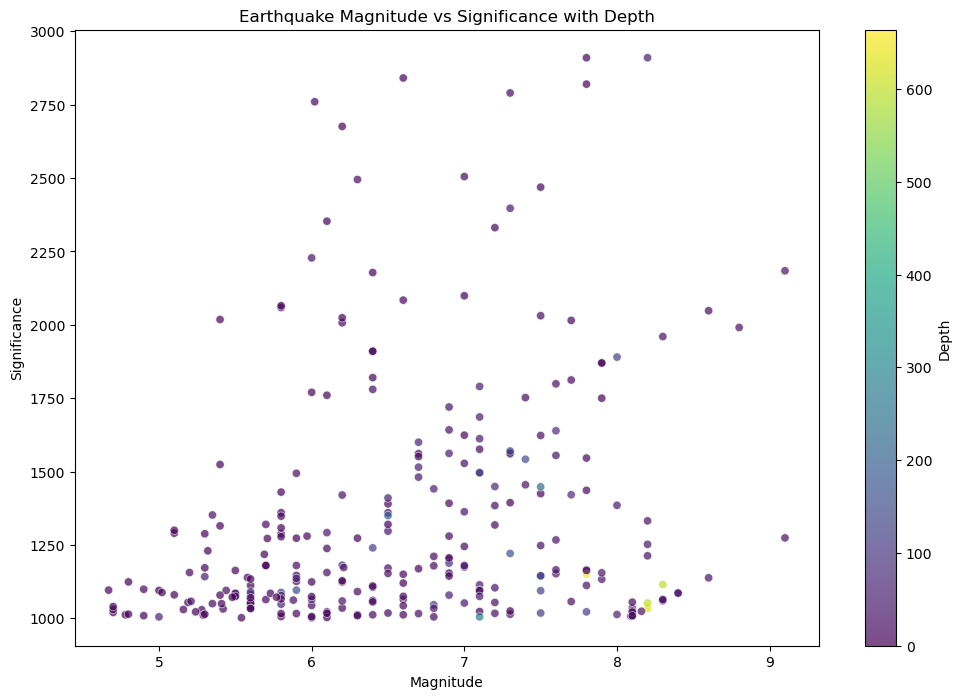

In [ ]:
# Set your magnitude and significance thresholds
magnitude_threshold = 3.0
significance_threshold = 1000.0

# Apply filtering based on thresholds
filtered_df = filtered_df[(filtered_df['magnitudo'] > magnitude_threshold) & (filtered_df['significance'] > significance_threshold)]

# Create a scatter plot
plt.figure(figsize=(12, 8))

plt.scatter(filtered_df['magnitudo'], filtered_df['significance'], c=filtered_df['depth'], cmap='viridis', alpha=0.7, edgecolors='w', linewidth=0.5)

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('Depth')

# Set labels and title
plt.xlabel('Magnitude')
plt.ylabel('Significance')
plt.title('Earthquake Magnitude vs Significance with Depth')

# Show the plot
plt.show()

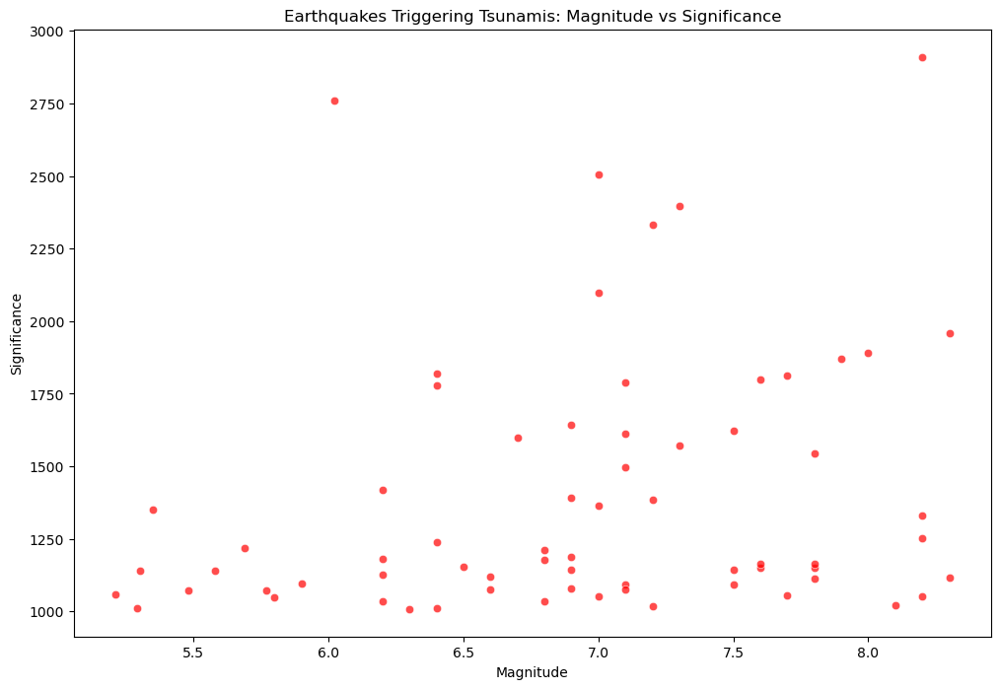

In [ ]:
# Set your magnitude and significance thresholds
magnitude_threshold = 3.0
significance_threshold = 1000.0

# Apply filtering based on thresholds and tsunami
filtered_df = df[(df['magnitudo'] > magnitude_threshold) & (df['significance'] > significance_threshold) & (df['tsunami'] == 1)]

# Create a scatter plot
plt.figure(figsize=(12, 8))

plt.scatter(filtered_df['magnitudo'], filtered_df['significance'], c='red', alpha=0.7, edgecolors='w', linewidth=0.5)

# Set labels and title
plt.xlabel('Magnitude')
plt.ylabel('Significance')
plt.title('Earthquakes Triggering Tsunamis: Magnitude vs Significance')

# Show the plot
plt.show()

C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\3808680154.py:20: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



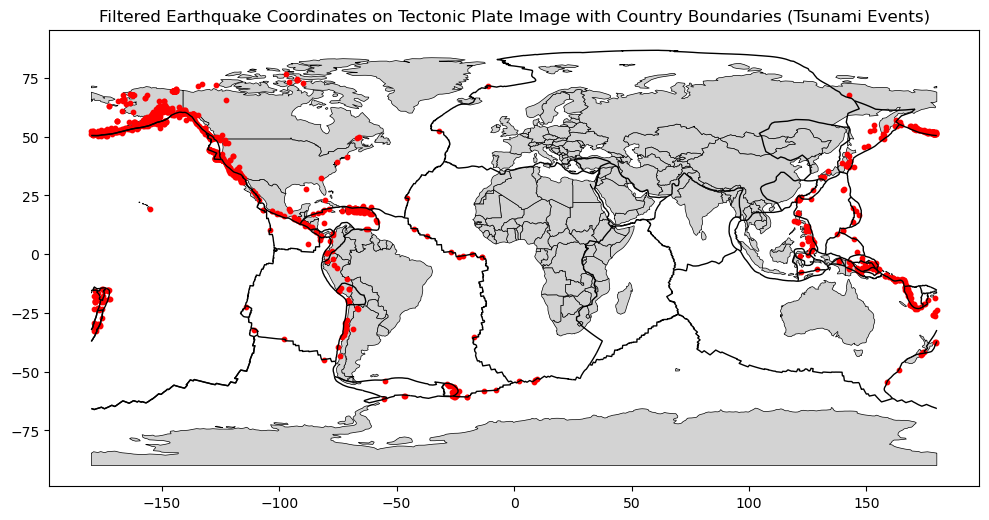

In [ ]:
# Set your magnitude and significance thresholds
magnitude_threshold = 2
significance_threshold = 0
depth_threshold = 0

# Apply filtering based on thresholds and tsunami
filtered_df = df[(df['magnitudo'] > magnitude_threshold) &
                 (df['significance'] > significance_threshold) &
                 (df['depth'] > depth_threshold) &
                 (df['tsunami'] == 1)]

# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(filtered_df['longitude'], filtered_df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(filtered_df, geometry=earthquake_geometry)

# Download and load tectonic plate boundary data using geopandas
plate_boundaries_gdf = gpd.read_file('PB2002_boundaries.shp')

# Download and load world countries boundary data using geopandas
world_countries_gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create a world map with tectonic plate boundaries, countries, and filtered earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot filtered earthquake coordinates on top of the map, with larger symbols for better visibility
earthquake_gdf.plot(ax=ax, color='red', markersize=10)

# Set plot title and show the map
plt.title('Filtered Earthquake Coordinates on Tectonic Plate Image with Country Boundaries (Tsunami Events)')
plt.show()

## Preparing Data and getting rid of not usefull data

In [ ]:
# Drop rows where 'data_type' is not equal to "earthquake"
df = df[df['data_type'] == 'earthquake']

# Verify the updated DataFrame
print(df.head())

           time                                 place    status  tsunami  \
0  631153353990     12 km NNW of Meadow Lakes, Alaska  Reviewed        0   
1  631153491210            14 km S of Volcano, Hawaii  Reviewed        0   
2  631154083450            7 km W of Cobb, California  Reviewed        0   
3  631155512130  11 km E of Mammoth Lakes, California  Reviewed        0   
4  631155824490                16km N of Fillmore, CA  Reviewed        0   

   significance   data_type  magnitudo        state   longitude   latitude  \
0            96  earthquake       2.50       Alaska -149.669200  61.730200   
1            31  earthquake       1.41       Hawaii -155.212333  19.317667   
2            19  earthquake       1.11   California -122.806167  38.821000   
3            15  earthquake       0.98   California -118.846333  37.664333   
4           134  earthquake       2.95   California -118.934000  34.546000   

    depth                             date  hour  day_of_month weekday  mo

In [ ]:
df['data_type'].value_counts()


earthquake    3345360
Name: data_type, dtype: int64

In [ ]:
df.columns

Index(['time', 'place', 'status', 'tsunami', 'significance', 'data_type',
       'magnitudo', 'state', 'longitude', 'latitude', 'depth', 'date', 'hour',
       'day_of_month', 'weekday', 'month', 'month_name', 'year',
       'data_type_group'],
      dtype='object')

In [ ]:
columns_to_drop = ['data_type', 'data_type_group', 'place',]

# Drop the specified columns
df.drop(columns=columns_to_drop, inplace=True)



C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\3433417709.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df.head()

,time,status,tsunami,significance,magnitudo,state,longitude,latitude,depth,date,hour,day_of_month,weekday,month,month_name,year
0,631153353990,Reviewed,0,96,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00,0,1,Monday,1,January,1990
1,631153491210,Reviewed,0,31,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00,0,1,Monday,1,January,1990
2,631154083450,Reviewed,0,19,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00,0,1,Monday,1,January,1990
3,631155512130,Reviewed,0,15,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00,0,1,Monday,1,January,1990
4,631155824490,Reviewed,0,134,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00,1,1,Monday,1,January,1990


In [ ]:
# Select columns with object (categorical) data types
num_cols = df.select_dtypes(include='object').columns.tolist()

# Initialize the LabelEncoder
le = LabelEncoder()

# Apply Label Encoding to the selected numerical columns
for x in num_cols:
    df[x] = le.fit_transform(df[x])

# Now, your categorical columns (excluding column 0) have been converted to numerical values
df.head()

C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\3058446877.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\3058446877.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\3058446877.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

,time,status,tsunami,significance,magnitudo,state,longitude,latitude,depth,date,hour,day_of_month,weekday,month,month_name,year
0,631153353990,2,0,96,2.50,6,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00,0,1,1,1,4,1990
1,631153491210,2,0,31,1.41,106,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00,0,1,1,1,4,1990
2,631154083450,2,0,19,1.11,46,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00,0,1,1,1,4,1990
3,631155512130,2,0,15,0.98,46,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00,0,1,1,1,4,1990
4,631155824490,2,0,134,2.95,373,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00,1,1,1,1,4,1990


C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\1693270413.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



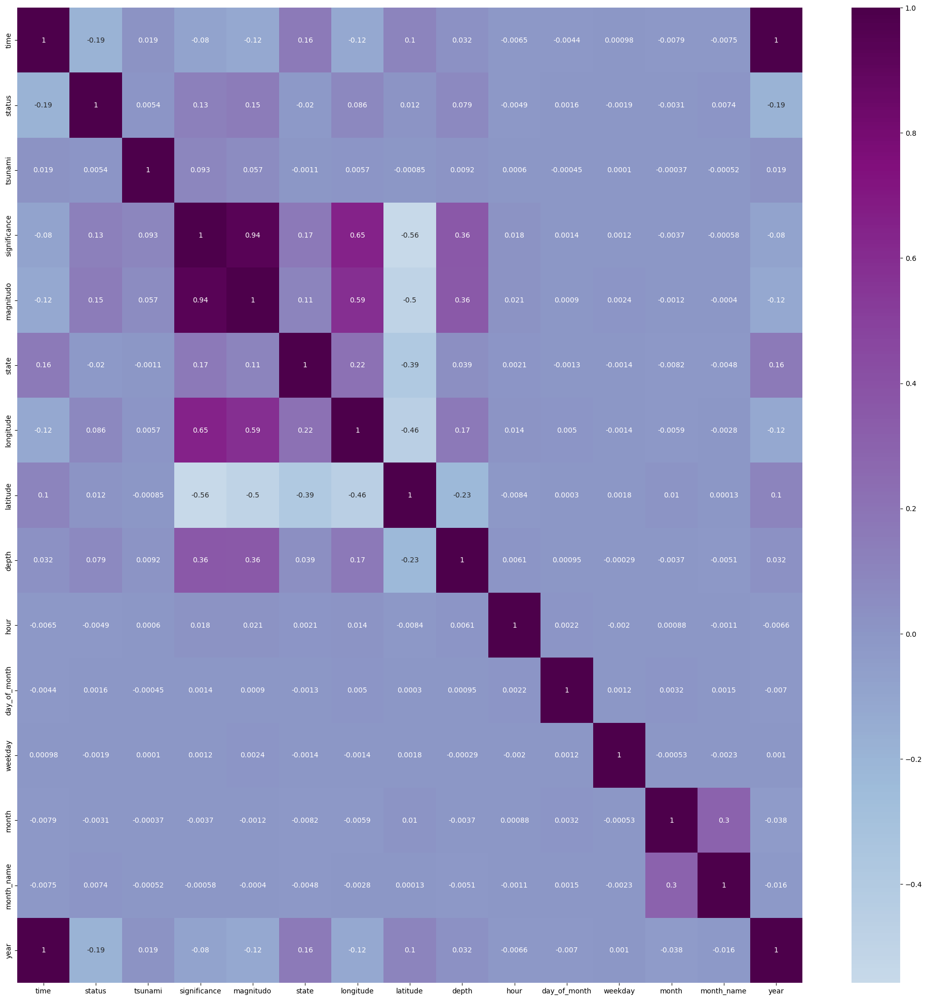

In [ ]:
Corr_Matrix = df.corr()

# Set up the figure and plot the heatmap
plt.figure(figsize=(25,25))
sns.heatmap(Corr_Matrix, annot=True, cmap='BuPu', center=0)
plt.show()

In [ ]:
print('Top 5 Most Positively Correlated to the To magnitudo')
Corr_Matrix['magnitudo'].sort_values(ascending=False).head(5)

Top 5 Most Positively Correlated to the To magnitudo


magnitudo       1.000000
significance    0.939624
longitude       0.591759
depth           0.357486
status          0.151475
Name: magnitudo, dtype: float64

In [ ]:
print('Top 5 Most Negatively Correlated to magnitudo ')
Corr_Matrix['magnitudo'].sort_values(ascending=True).head(5)

Top 5 Most Negatively Correlated to magnitudo 


latitude     -0.496018
time         -0.119137
year         -0.119021
month        -0.001177
month_name   -0.000397
Name: magnitudo, dtype: float64

In [ ]:
df.dtypes

time                          int64
status                        int32
tsunami                       int64
significance                  int64
magnitudo                   float64
state                         int32
longitude                   float64
latitude                    float64
depth                       float64
date            datetime64[ns, UTC]
hour                          int64
day_of_month                  int64
weekday                       int32
month                         int64
month_name                    int32
year                          int64
dtype: object

In [ ]:
columns_to_drop = ['date','time']

# Drop the specified columns
df.drop(columns=columns_to_drop, inplace=True)

# Verify the updated DataFrame
print(df.head())

   status  tsunami  significance  magnitudo  state   longitude   latitude  \
0       2        0            96       2.50      6 -149.669200  61.730200   
1       2        0            31       1.41    106 -155.212333  19.317667   
2       2        0            19       1.11     46 -122.806167  38.821000   
3       2        0            15       0.98     46 -118.846333  37.664333   
4       2        0           134       2.95    373 -118.934000  34.546000   

    depth  hour  day_of_month  weekday  month  month_name  year  
0  30.100     0             1        1      1           4  1990  
1   6.585     0             1        1      1           4  1990  
2   3.220     0             1        1      1           4  1990  
3  -0.584     0             1        1      1           4  1990  
4  16.122     1             1        1      1           4  1990  


C:\Users\mubin\AppData\Local\Temp\ipykernel_22356\294869328.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Modeling - We are only using 40% of the data as there are over 3 million rows and it takes a lot of time for the algos to run

In [ ]:
# Set the percentage of data you want to sample
sample_percentage = 0.4  # for example, 40%

# Perform random sampling
sampled_df = df.sample(frac=sample_percentage, random_state=42)

# Split the sampled data into features (X) and target variable (y)
X = sampled_df.drop('magnitudo', axis=1)  # Replace 'target_column' with your actual target variable
y = sampled_df['magnitudo']

# Split the data into training and testing sets
X_train_sampled, X_test_sampled, y_train_sampled, y_test_sampled = train_test_split(X, y, test_size=0.2, random_state=42)

### We use Linear regression because it can process large amount of data faster and we use ridge regression incase our Linear regression model overfits.

In [ ]:
# Linear Regression
linear_reg = LinearRegression()
linear_param_grid = {'fit_intercept': [True, False]}

linear_grid_search = GridSearchCV(estimator=linear_reg, param_grid=linear_param_grid,
                                  scoring='neg_mean_squared_error', cv=5)
linear_grid_search.fit(X_train_sampled, y_train_sampled)

best_linear_model = linear_grid_search.best_estimator_

# Ensure the Linear Regression model is fitted before making predictions
best_linear_model.fit(X_train_sampled, y_train_sampled)
y_pred_linear = best_linear_model.predict(X_test_sampled)

# Evaluate the best Linear Regression model on the test set
mse_linear = mean_squared_error(y_test_sampled, y_pred_linear)
mae_linear = mean_absolute_error(y_test_sampled, y_pred_linear)
r2_linear = r2_score(y_test_sampled, y_pred_linear)

print(f"Linear Regression MSE on Test Set: {mse_linear}")
print(f"Linear Regression MAE on Test Set: {mae_linear}")
print(f"Linear Regression R-squared on Test Set: {r2_linear}")

Linear Regression MSE on Test Set: 0.18299028142579157
Linear Regression MAE on Test Set: 0.2918782287147294
Linear Regression R-squared on Test Set: 0.8921376285793395


In [ ]:
# Ridge Regression
ridge_reg = Ridge()
ridge_param_grid = {'alpha': [0.1, 1, 10]}

ridge_grid_search = GridSearchCV(estimator=ridge_reg, param_grid=ridge_param_grid,
                                 scoring='neg_mean_squared_error', cv=5)
ridge_grid_search.fit(X_train_sampled, y_train_sampled)

best_ridge_model = ridge_grid_search.best_estimator_

# Ensure the Ridge Regression model is fitted before making predictions
best_ridge_model.fit(X_train_sampled, y_train_sampled)
y_pred_ridge = best_ridge_model.predict(X_test_sampled)

# Evaluate the best Ridge Regression model on the test set
mse_ridge = mean_squared_error(y_test_sampled, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test_sampled, y_pred_ridge)
r2_ridge = r2_score(y_test_sampled, y_pred_ridge)

print(f"Ridge Regression MSE on Test Set: {mse_ridge}")
print(f"Ridge Regression MAE on Test Set: {mae_ridge}")
print(f"Ridge Regression R-squared on Test Set: {r2_ridge}")


Ridge Regression MSE on Test Set: 0.18299030717271236
Ridge Regression MAE on Test Set: 0.29187837620474627
Ridge Regression R-squared on Test Set: 0.892137613402993


In [ ]:
# XGBoost Regressor
xgb_reg = xgb.XGBRegressor()
xgb_param_grid = {'learning_rate': [0.01, 0.1, 0.2],
                  'max_depth': [3, 4, 5],
                  'n_estimators': [100, 200, 300]}

xgb_grid_search = GridSearchCV(estimator=xgb_reg, param_grid=xgb_param_grid,
                                scoring='neg_mean_squared_error', cv=5)
xgb_grid_search.fit(X_train_sampled, y_train_sampled)

best_xgb_model = xgb_grid_search.best_estimator_

# Ensure the XGBoost model is fitted before making predictions
best_xgb_model.fit(X_train_sampled, y_train_sampled)
y_pred_xgb = best_xgb_model.predict(X_test_sampled)

# Evaluate the best XGBoost model on the test set
mse_xgb = mean_squared_error(y_test_sampled, y_pred_xgb)
mae_xgb = mean_absolute_error(y_test_sampled, y_pred_xgb)
r2_xgb = r2_score(y_test_sampled, y_pred_xgb)

print(f"XGBoost Regressor MSE on Test Set: {mse_xgb}")
print(f"XGBoost Regressor MAE on Test Set: {mae_xgb}")
print(f"XGBoost Regressor R-squared on Test Set: {r2_xgb}")

XGBoost Regressor MSE on Test Set: 0.017676093050830195
XGBoost Regressor MAE on Test Set: 0.019902806337298774
XGBoost Regressor R-squared on Test Set: 0.9895809476926348


### Here we predict values for every 1000 iterations to get any idea of how our model is performing

In [ ]:
for i, (actual, predicted) in enumerate(zip(y_test_sampled, y_pred_linear), 1):
    if i % 1000 == 0:
        print(f"Iteration: {i}  |  Actual Magnitude: {actual:.2f}  |  Predicted Magnitude: {predicted:.2f}")

Iteration: 1000  |  Actual Magnitude: 0.80  |  Predicted Magnitude: 0.91
Iteration: 2000  |  Actual Magnitude: 4.10  |  Predicted Magnitude: 3.89
Iteration: 3000  |  Actual Magnitude: 1.20  |  Predicted Magnitude: 1.12
Iteration: 4000  |  Actual Magnitude: 1.39  |  Predicted Magnitude: 1.33
Iteration: 5000  |  Actual Magnitude: 3.13  |  Predicted Magnitude: 2.81
Iteration: 6000  |  Actual Magnitude: 4.80  |  Predicted Magnitude: 5.16
Iteration: 7000  |  Actual Magnitude: 2.40  |  Predicted Magnitude: 2.10
Iteration: 8000  |  Actual Magnitude: 1.50  |  Predicted Magnitude: 1.39
Iteration: 9000  |  Actual Magnitude: 2.07  |  Predicted Magnitude: 1.70
Iteration: 10000  |  Actual Magnitude: 1.30  |  Predicted Magnitude: 1.38
Iteration: 11000  |  Actual Magnitude: 4.40  |  Predicted Magnitude: 4.28
Iteration: 12000  |  Actual Magnitude: 1.40  |  Predicted Magnitude: 1.36
Iteration: 13000  |  Actual Magnitude: -0.10  |  Predicted Magnitude: 0.73
Iteration: 14000  |  Actual Magnitude: 1.74  |

In [ ]:
for i, (actual, predicted) in enumerate(zip(y_test_sampled, y_pred_ridge), 1):
    if i % 1000 == 0:
        print(f"Iteration: {i}  |  Actual Magnitude: {actual:.2f}  |  Predicted Magnitude: {predicted:.2f}")

Iteration: 1000  |  Actual Magnitude: 0.80  |  Predicted Magnitude: 0.91
Iteration: 2000  |  Actual Magnitude: 4.10  |  Predicted Magnitude: 3.89
Iteration: 3000  |  Actual Magnitude: 1.20  |  Predicted Magnitude: 1.12
Iteration: 4000  |  Actual Magnitude: 1.39  |  Predicted Magnitude: 1.33
Iteration: 5000  |  Actual Magnitude: 3.13  |  Predicted Magnitude: 2.81
Iteration: 6000  |  Actual Magnitude: 4.80  |  Predicted Magnitude: 5.16
Iteration: 7000  |  Actual Magnitude: 2.40  |  Predicted Magnitude: 2.10
Iteration: 8000  |  Actual Magnitude: 1.50  |  Predicted Magnitude: 1.39
Iteration: 9000  |  Actual Magnitude: 2.07  |  Predicted Magnitude: 1.70
Iteration: 10000  |  Actual Magnitude: 1.30  |  Predicted Magnitude: 1.38
Iteration: 11000  |  Actual Magnitude: 4.40  |  Predicted Magnitude: 4.28
Iteration: 12000  |  Actual Magnitude: 1.40  |  Predicted Magnitude: 1.36
Iteration: 13000  |  Actual Magnitude: -0.10  |  Predicted Magnitude: 0.73
Iteration: 14000  |  Actual Magnitude: 1.74  |

In [ ]:
for i, (actual, predicted) in enumerate(zip(y_test_sampled, y_pred_xgb), 1):
    if i % 1000 == 0:
        print(f"Iteration: {i}  |  Actual Magnitude: {actual:.2f}  |  Predicted Magnitude: {predicted:.2f}")

Iteration: 1000  |  Actual Magnitude: 0.80  |  Predicted Magnitude: 0.80
Iteration: 2000  |  Actual Magnitude: 4.10  |  Predicted Magnitude: 4.10
Iteration: 3000  |  Actual Magnitude: 1.20  |  Predicted Magnitude: 1.20
Iteration: 4000  |  Actual Magnitude: 1.39  |  Predicted Magnitude: 1.40
Iteration: 5000  |  Actual Magnitude: 3.13  |  Predicted Magnitude: 3.13
Iteration: 6000  |  Actual Magnitude: 4.80  |  Predicted Magnitude: 4.80
Iteration: 7000  |  Actual Magnitude: 2.40  |  Predicted Magnitude: 2.40
Iteration: 8000  |  Actual Magnitude: 1.50  |  Predicted Magnitude: 1.50
Iteration: 9000  |  Actual Magnitude: 2.07  |  Predicted Magnitude: 2.08
Iteration: 10000  |  Actual Magnitude: 1.30  |  Predicted Magnitude: 1.30
Iteration: 11000  |  Actual Magnitude: 4.40  |  Predicted Magnitude: 4.40
Iteration: 12000  |  Actual Magnitude: 1.40  |  Predicted Magnitude: 1.40
Iteration: 13000  |  Actual Magnitude: -0.10  |  Predicted Magnitude: -0.21
Iteration: 14000  |  Actual Magnitude: 1.74  

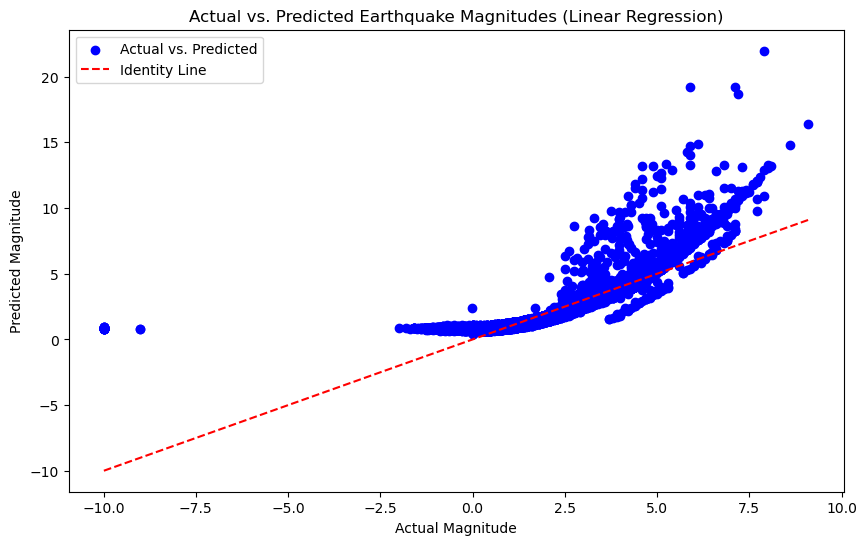

In [ ]:

# Sort the values for plotting
y_test_sorted, y_pred_linear_sorted = zip(*sorted(zip(y_test_sampled, y_pred_linear)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_linear_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (Linear Regression)")
plt.legend()
plt.show()

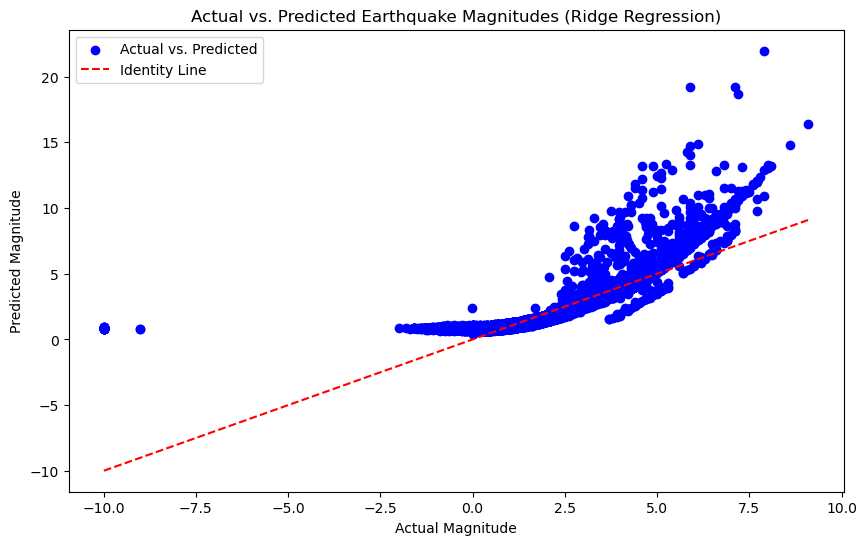

In [ ]:

# Sort the values for plotting
y_test_sorted, y_pred_ridge_sorted = zip(*sorted(zip(y_test_sampled, y_pred_ridge)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_ridge_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (Ridge Regression)")
plt.legend()
plt.show()


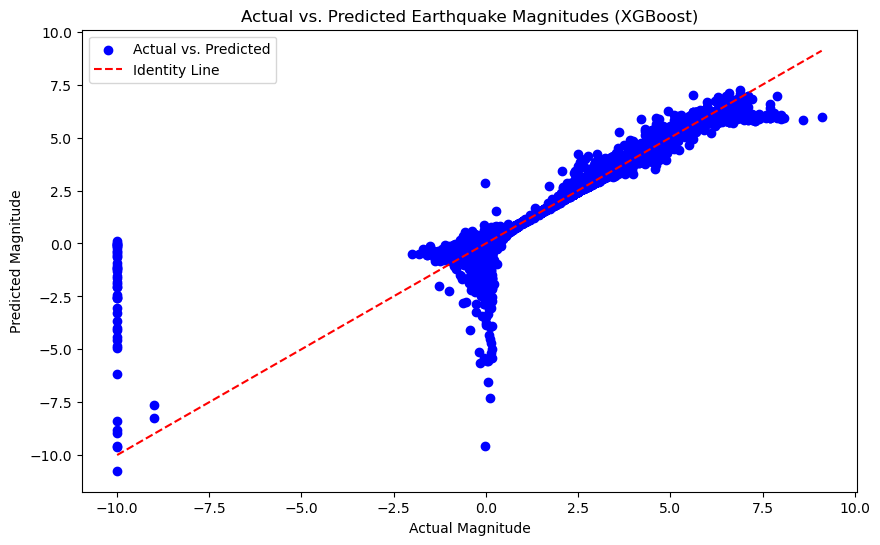

In [ ]:
# Sort the values for plotting
y_test_sorted, y_pred_xgb_sorted = zip(*sorted(zip(y_test_sampled, y_pred_xgb)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_xgb_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (XGBoost)")
plt.legend()
plt.show()

In [ ]:

# Define the DecisionTreeRegressor with default parameters
dt_regressor = DecisionTreeRegressor()

# Train the Decision Tree model on the training set
dt_regressor.fit(X_train_sampled, y_train_sampled)

# Make predictions on the test set
y_pred_dt = dt_regressor.predict(X_test_sampled)

# Evaluate the Decision Tree model
mse_dt = mean_squared_error(y_test_sampled, y_pred_dt)
mae_dt = mean_absolute_error(y_test_sampled, y_pred_dt)
r2_dt = r2_score(y_test_sampled, y_pred_dt)

print("Mean Squared Error on Test Set (Decision Tree):", mse_dt)
print("Mean Absolute Error on Test Set (Decision Tree):", mae_dt)
print("R-squared on Test Set (Decision Tree):", r2_dt)


Mean Squared Error on Test Set (Decision Tree): 0.03146286579588619
Mean Absolute Error on Test Set (Decision Tree): 0.01930841444518289
R-squared on Test Set (Decision Tree): 0.9814544286724293


In [ ]:

# Define the RandomForestRegressor with default parameters
rf_regressor = RandomForestRegressor()

# Train the Random Forest model on the training set
rf_regressor.fit(X_train_sampled, y_train_sampled)

# Make predictions on the test set
y_pred_rf = rf_regressor.predict(X_test_sampled)

# Evaluate the Random Forest model
mse_rf = mean_squared_error(y_test_sampled, y_pred_rf)
mae_rf = mean_absolute_error(y_test_sampled, y_pred_rf)
r2_rf = r2_score(y_test_sampled, y_pred_rf)

print("Mean Squared Error on Test Set (Random Forest):", mse_rf)
print("Mean Absolute Error on Test Set (Random Forest):", mae_rf)
print("R-squared on Test Set (Random Forest):", r2_rf)


Mean Squared Error on Test Set (Random Forest): 0.017138338539015818
Mean Absolute Error on Test Set (Random Forest): 0.01562594026571847
R-squared on Test Set (Random Forest): 0.9898979234163428


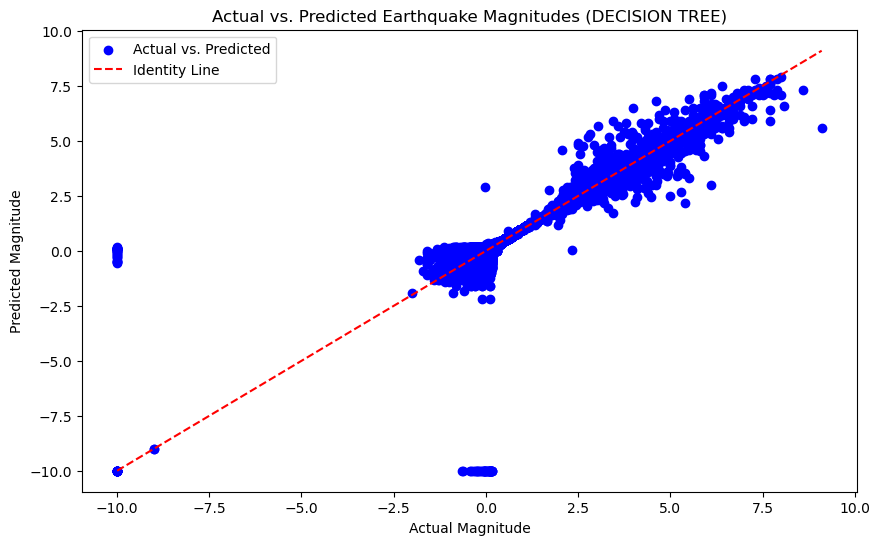

In [ ]:
# Sort the values for plotting
y_test_sorted, y_pred_ridge_sorted = zip(*sorted(zip(y_test_sampled, y_pred_dt)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_ridge_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (DECISION TREE)")
plt.legend()
plt.show()

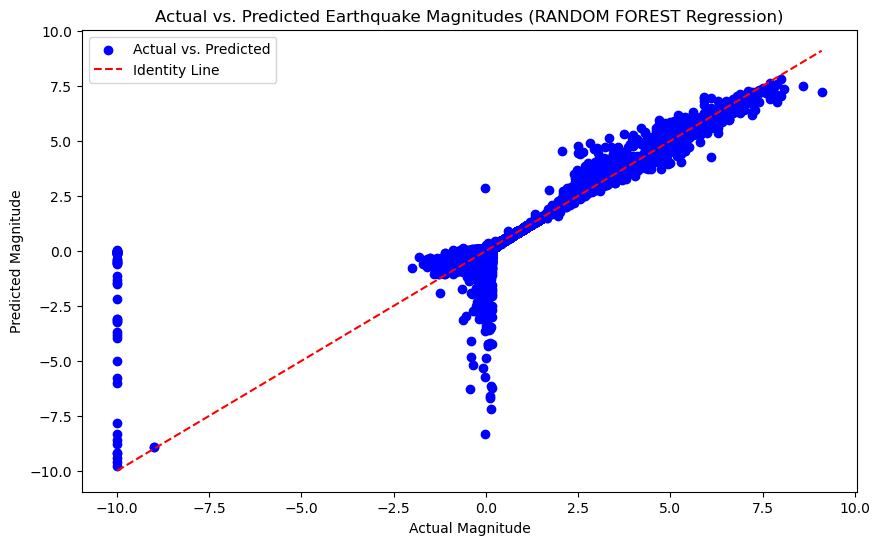

In [ ]:
# Sort the values for plotting
y_test_sorted, y_pred_ridge_sorted = zip(*sorted(zip(y_test_sampled, y_pred_rf)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_ridge_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (RANDOM FOREST Regression)")
plt.legend()
plt.show()

# References

[1] https://www.kaggle.com/datasets/alessandrolobello/the-ultimate-earthquake-dataset-from-1990-2023/data

[2] https://github.com/fraxen/tectonicplates

[3]https://www.naturalearthdata.com/downloads/110m-cultural-vectors/

[4]https://ydata.ai/?utm_source=opensource&utm_medium=pandasprofiling&utm_campaign=report

#License

##MIT License

Copyright (c) 2024 baiganas

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

